In [27]:
import pandas as pd
import re
import nltk
from nltk import word_tokenize
nltk.download('stopwords')
from nltk.corpus import stopwords
stopword_list = stopwords.words('english')
from nltk.stem.wordnet import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
from nltk.corpus import wordnet
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from collections import Counter
import datetime

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vileg\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


In [2]:
# read the data from .csv file and store it as a dataframe
tweets_data = pd.read_csv('csv/vaccination_all_tweets.csv', engine='python')

In [3]:
tweets_data.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


In [5]:
# examine the contents of all the columns
tweets_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228207 entries, 0 to 228206
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                228207 non-null  int64 
 1   user_name         228205 non-null  object
 2   user_location     161296 non-null  object
 3   user_description  211189 non-null  object
 4   user_created      228207 non-null  object
 5   user_followers    228207 non-null  int64 
 6   user_friends      228207 non-null  int64 
 7   user_favourites   228207 non-null  int64 
 8   user_verified     228207 non-null  bool  
 9   date              228207 non-null  object
 10  text              228207 non-null  object
 11  hashtags          178504 non-null  object
 12  source            228088 non-null  object
 13  retweets          228207 non-null  int64 
 14  favorites         228207 non-null  int64 
 15  is_retweet        228207 non-null  bool  
dtypes: bool(2), int64(6), object(8)
memory

In [6]:
# convert date column to datetime stamp
tweets_data['date'] = pd.to_datetime(tweets_data['date'])

In [7]:
tweets_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228207 entries, 0 to 228206
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   id                228207 non-null  int64         
 1   user_name         228205 non-null  object        
 2   user_location     161296 non-null  object        
 3   user_description  211189 non-null  object        
 4   user_created      228207 non-null  object        
 5   user_followers    228207 non-null  int64         
 6   user_friends      228207 non-null  int64         
 7   user_favourites   228207 non-null  int64         
 8   user_verified     228207 non-null  bool          
 9   date              228207 non-null  datetime64[ns]
 10  text              228207 non-null  object        
 11  hashtags          178504 non-null  object        
 12  source            228088 non-null  object        
 13  retweets          228207 non-null  int64         
 14  favo

In [9]:
# check for duplicate values
tweets_data[tweets_data.duplicated()]

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet


In [11]:
# returns total rows and columns, respectively as a tuple
tweets_data.shape

(228207, 16)

<h2>Clean tweets</h2>

In [60]:
def clean_tweets(tweets):
    # Add whitespace to the end of every tweet
    tweets['clean_tweet'] = tweets['text'].map(lambda x: x + " ") 
    # Remove http links
    tweets['clean_tweet'] = tweets['clean_tweet'].map(lambda x: re.sub(r'http.*', '', x))
    # Remove special characters and numbers
    tweets['clean_tweet'] = tweets['clean_tweet'].map(lambda x: re.sub(r"[^a-zA-Z#]", ' ', x))
    # Lowercase all tweets
    tweets['clean_tweet'] = tweets['clean_tweet'].map(lambda x: x.lower())
    # Tokenize words, eliminate stop words and store them back
    stopword_list = stopwords.words('english')
    for i in range(0, len(tweets['clean_tweet'])):
        tokens = word_tokenize(tweets['clean_tweet'].iloc[i])
        clean_tokens = [t for t in tokens if t not in stopword_list]
        tweets['clean_tweet'].iloc[i] = clean_tokens

In [49]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\vileg\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [55]:
clean_tweets(tweets_data)

C:\Users\vileg\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [57]:
tweets_data['clean_tweet'].iloc[0]

['folks',
 'said',
 'daikon',
 'paste',
 'could',
 'treat',
 'cytokine',
 'storm',
 '#',
 'pfizerbiontech']

<h2>Lemmatize tweets</h2>

In [61]:
def lemmatize_tweet(tweets):
    
    for i in range(len(tweets)):
        # Pos-tag each word in tweet
        for word in [tweets[i]]:
            pos_tag_list = nltk.pos_tag(word)
        # Convert pos-tag to be wordnet compliant
        wordnet_tags = []
        for j in pos_tag_list:
            # Adjective
            if j[1].startswith('J'):
                wordnet_tags.append(wordnet.ADJ)
            # Noun
            elif j[1].startswith('N'):
                wordnet_tags.append(wordnet.NOUN)
            # Adverb
            elif j[1].startswith('R'):
                wordnet_tags.append(wordnet.ADV)
            # Verb
            elif j[1].startswith('V'):
                wordnet_tags.append(wordnet.VERB)
            # Default to noun
            else:
                wordnet_tags.append(wordnet.NOUN)
        # Lemmatize each word in tweet
        lem_words = []
        for k in range(len(tweets[i])):
            lem_words.append(lemmatizer.lemmatize(tweets[i][k], pos=wordnet_tags[k]))
        lem_tweet = ' '.join(lem_words)
        tweets[i] = lem_tweet

In [63]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\vileg\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger.zip.


True

In [65]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\vileg\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\wordnet.zip.


True

In [66]:
lemmatize_tweet(tweets_data.clean_tweet)

C:\Users\vileg\AppData\Local\Temp/ipykernel_26564/2297349296.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets[i] = lem_tweet


In [67]:
tweets_data['clean_tweet'].iloc[0]

'folk say daikon paste could treat cytokine storm # pfizerbiontech'

In [93]:
tweets_data['clean_tweet'] = tweets_data['clean_tweet'].map(lambda x: x.replace('#', ''))

In [94]:
tweets_data['clean_tweet']

0         folk say daikon paste could treat cytokine sto...
1         world wrong side history year hopefully big va...
2          coronavirus  sputnikv  astrazeneca  pfizerbio...
3         fact immutable senator even ethically sturdy e...
4         explain need vaccine borisjohnson matthancock ...
                                ...                        
228202     urban  bengaluru  covidvaccine availability p...
228203     bbmp  bengaluru  covidvaccine availability pm...
228204     urban  bengaluru  covidvaccine availability p...
228205    promote vaccine leave strong russia vaccine  s...
228206     urban  bengaluru  covidvaccine availability p...
Name: clean_tweet, Length: 228207, dtype: object

<h2>Exploratory Data Analysis</h2>

<h3>1. What are the most common words?</h3>

In [95]:
# combine all the tweets to form a single tweet
all_tweets_combined = ' '.join([tweet for tweet in tweets_data['clean_tweet']])

In [96]:
all_tweets_combined

'folk say daikon paste could treat cytokine storm  pfizerbiontech world wrong side history year hopefully big vaccination effort ev  coronavirus  sputnikv  astrazeneca  pfizerbiontech  moderna  covid russian vaccine create last year fact immutable senator even ethically sturdy enough acknowledge born explain need vaccine borisjohnson matthancock  whereareallthesickpeople  pfizerbiontech anyone useful advice guidance whether covid vaccine safe whilst breastfeeding bit sad claim fame success  vaccination patriotic competition usa canada uk many bright day best  bidenharris win  election covid vaccine get  covidvaccine  covid  pfizerbiontech  moderna  covidvaccine state start get  covid vaccine monday  u say  pakustv  nyc  healthcare  globalgoals death close mark million people wait  pfizerbiontech  vaccine first u cnnbrk  covid  covidvaccine  vaccine  corona  pfizerbiontech  bbcnews  nytimes  bbcnews best wish u agency also release new information health care provider patient u ship mill

In [97]:
# split the single tweet into words and store it in a list
all_tweets_words_list = all_tweets_combined.split()

In [98]:
all_tweets_words_list

['folk',
 'say',
 'daikon',
 'paste',
 'could',
 'treat',
 'cytokine',
 'storm',
 'pfizerbiontech',
 'world',
 'wrong',
 'side',
 'history',
 'year',
 'hopefully',
 'big',
 'vaccination',
 'effort',
 'ev',
 'coronavirus',
 'sputnikv',
 'astrazeneca',
 'pfizerbiontech',
 'moderna',
 'covid',
 'russian',
 'vaccine',
 'create',
 'last',
 'year',
 'fact',
 'immutable',
 'senator',
 'even',
 'ethically',
 'sturdy',
 'enough',
 'acknowledge',
 'born',
 'explain',
 'need',
 'vaccine',
 'borisjohnson',
 'matthancock',
 'whereareallthesickpeople',
 'pfizerbiontech',
 'anyone',
 'useful',
 'advice',
 'guidance',
 'whether',
 'covid',
 'vaccine',
 'safe',
 'whilst',
 'breastfeeding',
 'bit',
 'sad',
 'claim',
 'fame',
 'success',
 'vaccination',
 'patriotic',
 'competition',
 'usa',
 'canada',
 'uk',
 'many',
 'bright',
 'day',
 'best',
 'bidenharris',
 'win',
 'election',
 'covid',
 'vaccine',
 'get',
 'covidvaccine',
 'covid',
 'pfizerbiontech',
 'moderna',
 'covidvaccine',
 'state',
 'start',


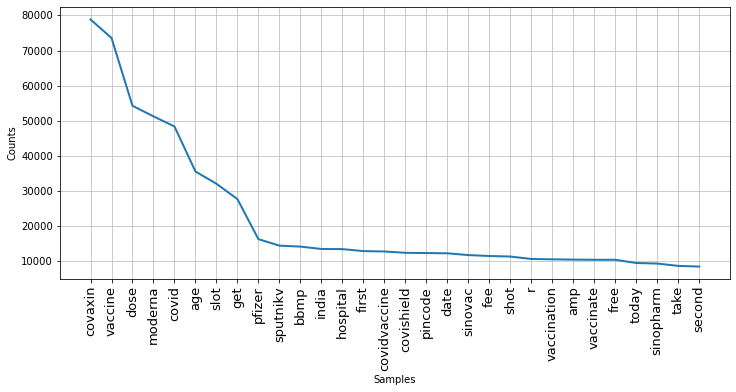

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [99]:
# plot the frequency distribution for first 30 words
plt.figure(figsize = (12, 5))
plt.xticks(fontsize = 13, rotation = 90)
freq_dist = nltk.FreqDist(all_tweets_words_list)
freq_dist.plot(30, cumulative = False)

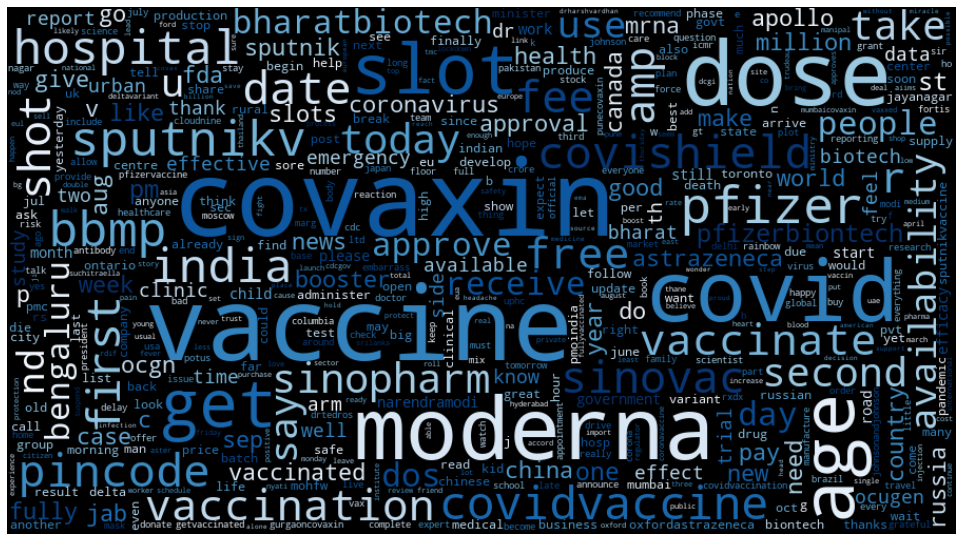

In [100]:
# wordcloud with word frequencies 
wordcloud = WordCloud(width = 900, height = 500, max_words = 500, max_font_size = 100, relative_scaling = 0.5, colormap = 'Blues', normalize_plurals = True).generate_from_frequencies(freq_dist)
plt.figure(figsize = (17, 14))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

<h3>2. What is the frequency of each word?</h3>

In [101]:
freq_dist

FreqDist({'covaxin': 78836, 'vaccine': 73584, 'dose': 54274, 'moderna': 51266, 'covid': 48388, 'age': 35576, 'slot': 32076, 'get': 27706, 'pfizer': 16311, 'sputnikv': 14469, ...})

In [102]:
word_freq = nltk.FreqDist(all_tweets_words_list)
word_freq_df = pd.DataFrame({'Word': list(word_freq.keys()), 'Frequency': list(word_freq.values())}).sort_values(by = ['Frequency'], ascending = False)
word_freq_df.head(30)

,Word,Frequency
4167,covaxin,78836
25,vaccine,73584
272,dose,54274
22,moderna,51266
23,covid,48388
703,age,35576
7100,slot,32076
67,get,27706
128,pfizer,16311
20,sputnikv,14469


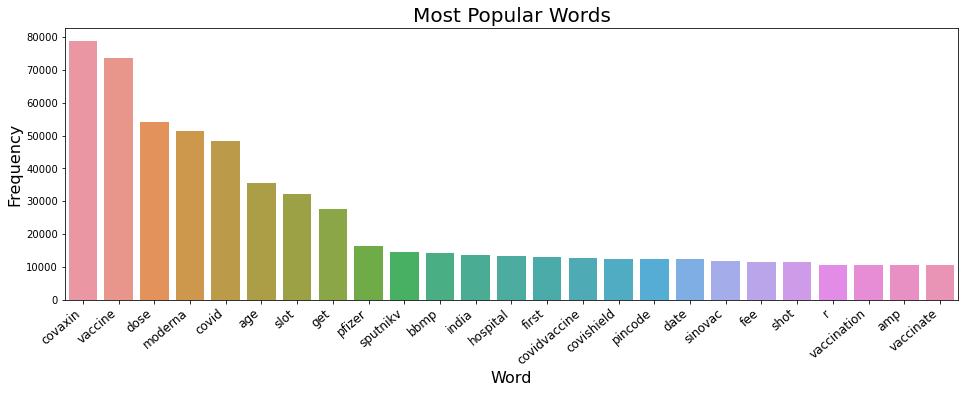

In [103]:
# Plot histogram of most frequent words

word_freq_df = word_freq_df.nlargest(columns="Frequency", n = 25) 
plt.figure(figsize=(16,5))
ax = sns.barplot(data=word_freq_df, x= "Word", y = "Frequency")
ax.set_ylabel('Frequency', fontsize=16)
ax.set_xlabel('Word', fontsize=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=12)
ax.set_title("Most Popular Words", fontsize=20)
plt.show()

<h3>3. What time sees the most number of tweets?</h3>

In [104]:
# Create a dataframe grouping the number of tweets by hour of the day

tweets_hour_df = pd.DataFrame(tweets_data.groupby(tweets_data['date'].dt.hour)['clean_tweet'].count()).reset_index()
tweets_hour_df = tweets_hour_df.rename(columns={'date': 'Hour', 'clean_tweet': 'Frequency'})
tweets_hour_df.Hour = tweets_hour_df.Hour.replace([0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0], ['12:00 AM', '1:00 AM', '2:00 AM', '3:00 AM', '4:00 AM', '5:00 AM', '6:00 AM', '7:00 AM', '8:00 AM', '9:00 AM', '10:00 AM', '11:00 AM', '12:00 AM', '1:00 PM', '2:00 PM', '3:00 PM', '4:00 PM', '5:00 PM', '6:00 PM', '7:00 PM', '8:00 PM', '9:00 PM', '10:00 PM', '11:00 PM'])
tweets_hour_df

,Hour,Frequency
0,12:00 AM,5428
1,1:00 AM,6345
2,2:00 AM,8267
3,3:00 AM,9068
4,4:00 AM,10061
5,5:00 AM,9848
6,6:00 AM,10871
7,7:00 AM,10592
8,8:00 AM,9819
9,9:00 AM,10196


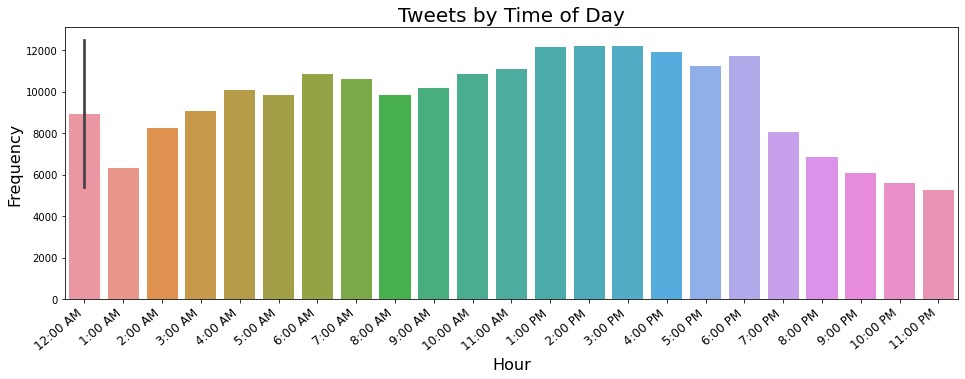

In [106]:
# Plot histogram of Tweet Counts by Hour

plt.figure(figsize=(16,5))
ax = sns.barplot(data=tweets_hour_df, x= "Hour", y = "Frequency")
ax.set_ylabel('Frequency', fontsize=16)
ax.set_xlabel('Hour', fontsize=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=12)
ax.set_title("Tweets by Time of Day", fontsize=20)
plt.show()

<h3>4. Which days sees the most number of tweets?</h3>

In [108]:
# Create a dataframe grouping the number of tweets by hour of the day
tweets_day_df = pd.DataFrame(tweets_data.resample('D', on='date')['clean_tweet'].count()).reset_index().sort_values(by='clean_tweet', ascending=False)
tweets_day_df = tweets_day_df.rename(columns={'date': 'Day', 'clean_tweet': 'Frequency'})
tweets_day_df.head()

,Day,Frequency
79,2021-03-01,2911
199,2021-06-29,2626
219,2021-07-19,2482
130,2021-04-21,2423
200,2021-06-30,2414


In [114]:
top_tweeted_days = tweets_day_df.sort_values(by = ['Frequency'], ascending=False)[:30]
top_tweeted_days

,Day,Frequency
79,2021-03-01,2911
199,2021-06-29,2626
219,2021-07-19,2482
130,2021-04-21,2423
200,2021-06-30,2414
223,2021-07-23,2372
193,2021-06-23,2225
326,2021-11-03,2160
192,2021-06-22,2153
121,2021-04-12,2049


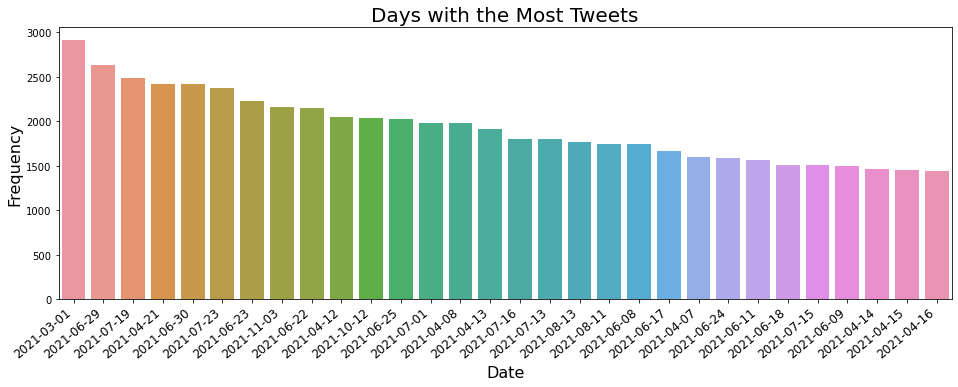

In [120]:
# Plot histogram of Tweet Counts by Day

plt.figure(figsize=(16,5))
ax = sns.barplot(data=top_tweeted_days, x= top_tweeted_days.Day.dt.date, y = "Frequency")
ax.set_ylabel('Frequency', fontsize=16)
ax.set_xlabel('Date', fontsize=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=12)
ax.set_title("Days with the Most Tweets", fontsize=20)
plt.show()

In [125]:
# Save the processed tweets data to file
tweets_data.to_csv('csv/processed_tweets.csv', encoding = 'utf-8')